In [ ]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 643.0 kB/s eta 0:00:000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.7/778.7 kB 5.9 MB/s eta 0:00:00a 0:00:01


In [3]:
!pip install roboflow
# Downloading Data from Roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="OOyWBqn0iuiGkDwDDKDV")
project = rf.workspace("ritesh-aqame").project("segmentation-12dac")
version = project.version(2)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 846.9 kB/s eta 0:00:000:00:010m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 2.4 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 32.5 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: certifi
    Found existing instal


Extracting Dataset Version Zip to Segmentation-2 in yolov8:: 100%|██████████| 802/802 [00:00<00:00, 6086.64it/s]


In [4]:
#For better visualization of model learning using wandb
!pip install wandb
import wandb
wandb.login(key="32c0e2c48d2843dba56832316dd12907c726e952")

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

# Let's start with nano model of Yolo for fine tuning

In [5]:
from ultralytics import YOLO
from PIL import Image
model=YOLO("yolov8s-seg.pt")

100%|██████████| 22.8M/22.8M [00:00<00:00, 149MB/s] 


In [6]:
%cd /kaggle/working/Segmentation-2

/kaggle/working/Segmentation-2


In [7]:
!ls

README.dataset.txt  README.roboflow.txt  data.yaml  test  train  valid


In [8]:
import yaml

# Load the YAML file and Change the path of it accordingly
with open('data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['test'] = '/kaggle/working/Segmentation-2/test/images'
data['train'] = '/kaggle/working/Segmentation-2/train/images'
data['val'] = '/kaggle/working/Segmentation-2/valid/images'

# Save the modified data back to the YAML file
with open('data.yaml', 'w') as file:
    yaml.dump(data, file)

In [9]:
results = model.train(data='/kaggle/working/Segmentation-2/data.yaml',
                      device=[0,1], 
                      epochs=60,
                      imgsz=640,
                      workers=8,
                      batch=16,
                      patience=15,
                      single_cls=True,
                      #optimizer='AdamW',
                      dropout=0.2,
                      name="Boat_Segmentation_S")

Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8s-seg.pt, data=/kaggle/working/Segmentation-2/data.yaml, epochs=60, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=Boat_Segmentation_S, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

100%|██████████| 755k/755k [00:00<00:00, 13.8MB/s]
2024-05-28 17:20:39,583	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-28 17:20:42,292	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 22.8M/22.8M [00:00<00:00, 140MB/s] 


TensorBoard: Start with 'tensorboard --logdir runs/segment/Boat_Segmentation_S', view at http://localhost:6006/


wandb: Currently logged in as: riteshkr142092111. Use `wandb login --relogin` to force relogin
wandb: wandb version 0.17.0 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.6
wandb: Run data is saved locally in /kaggle/working/Segmentation-2/wandb/run-20240528_172110-twqqwn4o
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run Boat_Segmentation_S
wandb: ⭐️ View project at https://wandb.ai/riteshkr142092111/YOLOv8
wandb: 🚀 View run at https://wandb.ai/riteshkr142092111/YOLOv8/runs/twqqwn4o


Overriding model.yaml nc=80 with nc=1
Transferred 411/417 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 70.4MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/Segmentation-2/train/labels... 357 images, 0 backgrounds, 0 corrupt: 100%|██████████| 357/357 [00:00<00:00, 893.24it/s]


train: New cache created: /kaggle/working/Segmentation-2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: New cache created: /kaggle/working/Segmentation-2/valid/labels.cache


val: Scanning /kaggle/working/Segmentation-2/valid/labels... 22 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22/22 [00:00<00:00, 825.59it/s]


Plotting labels to runs/segment/Boat_Segmentation_S/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 weight(decay=0.0005), 76 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/Boat_Segmentation_S
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/60      2.95G      1.197      3.297       2.55      1.283          8        640: 100%|██████████| 23/23 [00:11<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]


                   all         22         32      0.817      0.844       0.81      0.625      0.817      0.844      0.812      0.551

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/60      2.78G     0.9877      2.001       1.13      1.128          7        640: 100%|██████████| 23/23 [00:05<00:00,  4.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.31it/s]


                   all         22         32      0.834      0.969      0.946       0.74      0.834      0.969      0.946      0.711

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/60      2.89G     0.9832      1.881     0.8644      1.089          8        640: 100%|██████████| 23/23 [00:05<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.11it/s]


                   all         22         32      0.792          1       0.97      0.796      0.792          1       0.97      0.752

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/60      2.86G     0.9729       1.77     0.7786      1.126          7        640: 100%|██████████| 23/23 [00:05<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]


                   all         22         32      0.934          1       0.98      0.802      0.934          1       0.98      0.775

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/60      2.78G     0.9241      1.784     0.7156      1.105         12        640: 100%|██████████| 23/23 [00:05<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.05it/s]


                   all         22         32       0.82          1      0.969      0.796       0.82          1      0.969      0.785

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/60      2.83G     0.9416      1.697     0.6954       1.12         14        640: 100%|██████████| 23/23 [00:05<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]


                   all         22         32      0.953      0.875      0.956      0.762      0.953      0.875      0.956      0.724

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/60      2.82G     0.9256      1.683     0.6494      1.078          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.03it/s]


                   all         22         32      0.909      0.938       0.95      0.694      0.909      0.938       0.95      0.687

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/60      2.85G     0.9545      1.633     0.6627      1.115          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.06it/s]


                   all         22         32      0.926      0.812      0.937       0.74      0.926      0.812      0.937      0.696

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/60      2.82G     0.8833      1.706     0.6356      1.085          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.97it/s]


                   all         22         32      0.936      0.969       0.98      0.824      0.936      0.969       0.98       0.74

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/60      2.87G     0.8562      1.607     0.6192       1.06          4        640: 100%|██████████| 23/23 [00:05<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.24it/s]


                   all         22         32      0.936          1       0.99      0.815      0.936          1       0.99      0.766

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/60      2.82G     0.8817      1.655     0.6199      1.064          4        640: 100%|██████████| 23/23 [00:05<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.79it/s]


                   all         22         32      0.957      0.969       0.99      0.823      0.957      0.969       0.99       0.78

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/60      2.85G     0.8688      1.649     0.5549      1.044         10        640: 100%|██████████| 23/23 [00:05<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.74it/s]


                   all         22         32       0.91          1      0.982      0.821       0.91          1      0.982      0.779

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/60      2.87G     0.9202      1.666     0.5513       1.08          7        640: 100%|██████████| 23/23 [00:05<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.29it/s]


                   all         22         32      0.885      0.964      0.979      0.809      0.885      0.964      0.979      0.765

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/60      2.86G     0.8752      1.614     0.5363      1.055          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.15it/s]


                   all         22         32      0.916          1      0.991      0.837      0.916          1      0.991      0.789

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/60      2.85G     0.8719      1.594     0.5579      1.031         12        640: 100%|██████████| 23/23 [00:05<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.64it/s]


                   all         22         32      0.935      0.892      0.971      0.821      0.935      0.892      0.971      0.777

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/60      2.82G     0.8532       1.58     0.5769      1.056          4        640: 100%|██████████| 23/23 [00:05<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.56it/s]


                   all         22         32      0.964      0.969      0.992      0.834      0.964      0.969      0.992      0.797

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/60      2.86G     0.8631      1.558     0.5511      1.033          6        640: 100%|██████████| 23/23 [00:05<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.46it/s]


                   all         22         32      0.936      0.969      0.984      0.825      0.936      0.969      0.984      0.793

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/60      2.82G     0.8707       1.55     0.5346      1.028          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.77it/s]


                   all         22         32      0.963      0.969      0.985      0.841      0.963      0.969      0.985      0.787

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/60      2.84G     0.8151      1.543     0.5053      1.067          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.03it/s]


                   all         22         32      0.964      0.969      0.991      0.814      0.964      0.969      0.991      0.779

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/60      2.87G     0.7986      1.508     0.4865      1.038          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.76it/s]


                   all         22         32      0.969          1      0.994       0.84      0.969          1      0.994      0.812

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/60       2.8G     0.8275      1.527     0.5294      1.043          6        640: 100%|██████████| 23/23 [00:05<00:00,  4.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.37it/s]


                   all         22         32      0.964          1      0.994      0.832      0.964          1      0.994      0.782

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/60      2.82G      0.812      1.542     0.5057      1.044         15        640: 100%|██████████| 23/23 [00:05<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.67it/s]


                   all         22         32      0.962          1      0.994      0.851      0.962          1      0.994      0.791

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/60      2.82G     0.8019      1.468     0.4907      1.028          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.86it/s]


                   all         22         32       0.97      0.999      0.994      0.838       0.97      0.999      0.994      0.783

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/60      2.83G     0.7433      1.404     0.4733     0.9995          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.22it/s]


                   all         22         32      0.918      0.969      0.985      0.841      0.918      0.969      0.985      0.773

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/60      2.79G     0.8192      1.565     0.4956      1.044         13        640: 100%|██████████| 23/23 [00:05<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.75it/s]


                   all         22         32      0.941          1      0.992      0.853      0.941          1      0.992      0.795

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/60       2.8G     0.7892      1.471     0.4738      1.006          8        640: 100%|██████████| 23/23 [00:05<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.64it/s]


                   all         22         32      0.967      0.969      0.993      0.846      0.967      0.969      0.993      0.804

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/60      2.83G     0.7775      1.498     0.4361     0.9934          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.38it/s]


                   all         22         32      0.966      0.969       0.98      0.825      0.966      0.969       0.98      0.786

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/60      2.82G     0.7437      1.489     0.4559     0.9936         10        640: 100%|██████████| 23/23 [00:05<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.58it/s]


                   all         22         32      0.934      0.969      0.985      0.852      0.934      0.969      0.985      0.795

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/60      2.86G      0.763      1.395     0.4533      1.028          4        640: 100%|██████████| 23/23 [00:05<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.91it/s]


                   all         22         32      0.939      0.962      0.983      0.851      0.939      0.962      0.983       0.81

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/60      2.87G     0.7947      1.558     0.4776      1.029          7        640: 100%|██████████| 23/23 [00:05<00:00,  4.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.31it/s]


                   all         22         32      0.937          1      0.989      0.859      0.937          1      0.989      0.806

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/60      2.83G     0.7482      1.435     0.4407      1.006          6        640: 100%|██████████| 23/23 [00:05<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.92it/s]


                   all         22         32      0.941      0.989      0.993      0.856      0.941      0.989      0.993      0.797

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/60      2.87G     0.7125      1.334     0.4177     0.9961          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.65it/s]


                   all         22         32      0.981          1      0.995       0.86      0.981          1      0.995      0.798

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/60       2.8G     0.7357      1.396     0.4327      1.004          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.47it/s]


                   all         22         32      0.962          1      0.994      0.865      0.962          1      0.994      0.815

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/60      2.83G     0.7492      1.389     0.4502      1.018          9        640: 100%|██████████| 23/23 [00:05<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.96it/s]


                   all         22         32      0.964          1      0.994      0.865      0.964          1      0.994      0.841

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/60      2.88G     0.7576      1.426     0.4294      1.005          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.92it/s]


                   all         22         32      0.965          1      0.994      0.866      0.965          1      0.994      0.823

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/60      2.86G     0.7261      1.365     0.4283     0.9924          4        640: 100%|██████████| 23/23 [00:05<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.12it/s]


                   all         22         32      0.963          1      0.994      0.836      0.963          1      0.994      0.802

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/60       2.8G     0.7407      1.352     0.4233      1.019          6        640: 100%|██████████| 23/23 [00:05<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.81it/s]


                   all         22         32      0.966          1      0.993      0.831      0.966          1      0.993      0.796

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/60      2.87G     0.7019      1.298     0.4112     0.9917          9        640: 100%|██████████| 23/23 [00:05<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.13it/s]


                   all         22         32       0.97      0.998      0.994      0.858       0.97      0.998      0.994      0.806

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/60      2.83G     0.7368       1.38     0.4341      1.009          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.12it/s]


                   all         22         32      0.964      0.969      0.992      0.858      0.964      0.969      0.992      0.814

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/60      2.84G     0.7379      1.282     0.4068     0.9875          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.81it/s]


                   all         22         32       0.97      0.996      0.994      0.855       0.97      0.996      0.994      0.829

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/60       2.8G     0.7123      1.313     0.3854     0.9763          7        640: 100%|██████████| 23/23 [00:05<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.27it/s]


                   all         22         32       0.97      0.998      0.994      0.855       0.97      0.998      0.994      0.836

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/60      2.83G     0.7127      1.338     0.3859      1.004          6        640: 100%|██████████| 23/23 [00:05<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.85it/s]


                   all         22         32      0.976      0.969      0.993      0.861      0.976      0.969      0.993      0.824

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/60      2.89G     0.6666      1.309     0.3821     0.9777         10        640: 100%|██████████| 23/23 [00:05<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.61it/s]


                   all         22         32       0.97      0.999      0.994       0.87       0.97      0.999      0.994      0.799

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/60      2.83G      0.668      1.305     0.3651     0.9729          8        640: 100%|██████████| 23/23 [00:05<00:00,  4.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.53it/s]


                   all         22         32      0.994      0.969      0.993      0.872      0.994      0.969      0.993      0.802

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/60       2.8G      0.671      1.336     0.3798     0.9618          5        640: 100%|██████████| 23/23 [00:05<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.78it/s]


                   all         22         32      0.994      0.969      0.993      0.853      0.994      0.969      0.993      0.815

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/60       2.8G     0.7191      1.292     0.4072     0.9824         10        640: 100%|██████████| 23/23 [00:05<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.83it/s]


                   all         22         32      0.985      0.969      0.993      0.877      0.985      0.969      0.993      0.817

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/60      2.87G     0.6571      1.366     0.3783     0.9626         11        640: 100%|██████████| 23/23 [00:05<00:00,  4.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.09it/s]


                   all         22         32      0.964          1      0.994      0.881      0.964          1      0.994      0.807

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/60      2.83G     0.6695      1.335     0.3707     0.9654          9        640: 100%|██████████| 23/23 [00:05<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.02it/s]


                   all         22         32      0.963          1      0.993      0.871      0.963          1      0.993      0.796

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/60      2.77G     0.6436      1.266     0.3589     0.9477          8        640: 100%|██████████| 23/23 [00:05<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  6.24it/s]


                   all         22         32      0.968          1      0.993      0.858      0.968          1      0.993      0.794
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 34, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

49 epochs completed in 0.098 hours.
Optimizer stripped from runs/segment/Boat_Segmentation_S/weights/last.pt, 23.9MB
Optimizer stripped from runs/segment/Boat_Segmentation_S/weights/best.pt, 23.9MB

Validating runs/segment/Boat_Segmentation_S/weights/best.pt...
Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  5.43it/s]


                   all         22         32      0.964          1      0.994      0.865      0.964          1      0.994      0.841
Speed: 0.2ms preprocess, 7.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/segment/Boat_Segmentation_S


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                  lr/pg0 ▁▃▅▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:                  lr/pg1 ▁▃▅▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:                  lr/pg2 ▁▃▅▇███▇▇▇▇▇▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:        metrics/mAP50(B) ▁▆▇▇▇▆▆▇██▇█▇███████████████████████████
wandb:        metrics/mAP50(M) ▁▆▇▇▇▆▆▇██▇█▇███████████████████████████
wandb:     metrics/mAP50-95(B) ▁▄▆▆▆▃▄▆▆▆▆▇▆▆▇▆▇▇▇▇▇▇▇▇▇▇███▇▇▇▇▇▇█▇███
wandb:     metrics/mAP50-95(M) ▁▅▆▆▇▄▅▆▆��▆▇▆▇▇▇▇▇▇▆▇▇▇▇▇▇▇██▇▇▇███▇▇▇▇█
wandb:    metrics/precision(B) ▂▂▁▆▂▅▆▆▆▅▄▅▆▆▇▇▇▇▇▅▆▇▆▆▆▆▇▇▇▇▇▇▇▇▇███▇▇
wandb:    metrics/precision(M) ▂▂▁▆▂▅▆▆▆▅▄▅▆▆▇▇▇▇▇▅▆▇▆▆▆▆▇▇▇▇▇▇▇▇▇███▇▇
wandb:       metrics/recall(B) ▂▇███▆▁▇██▇█▄▇▇▇███▇█▇▇▇███████▇██▇▇▇▇██
wandb:       metrics/recall(M) ▂▇███▆▁▇██▇█▄▇▇▇███▇█▇▇▇███████▇██▇▇▇▇██
wandb:            model/GFLOPs ▁
wandb:        model/parameters ▁
wandb: model/speed_PyTorch

## Result Visualization

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def visualize_image(image_path):
    plt.figure(figsize=(20,20))
    img = mpimg.imread(image_path)
    
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Turn off axis
    plt.show()

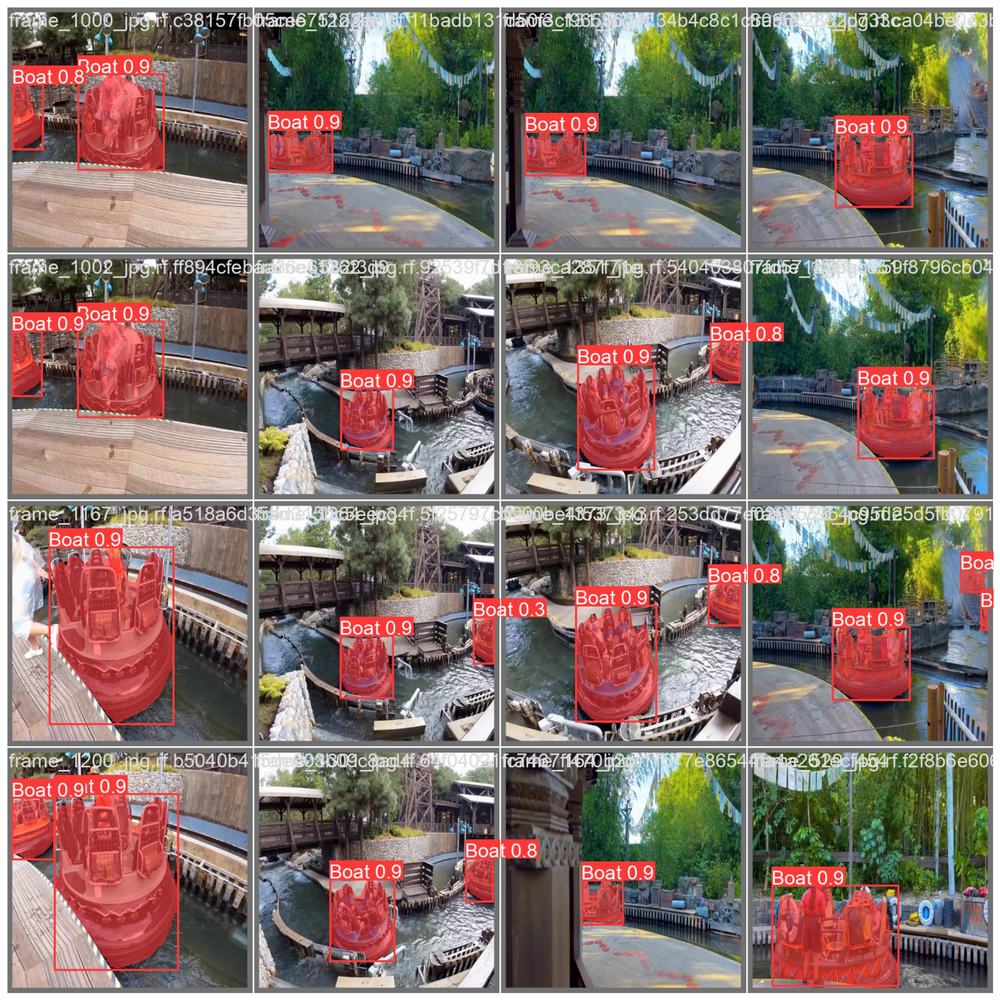

In [11]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/val_batch0_pred.jpg'
visualize_image(image_path)

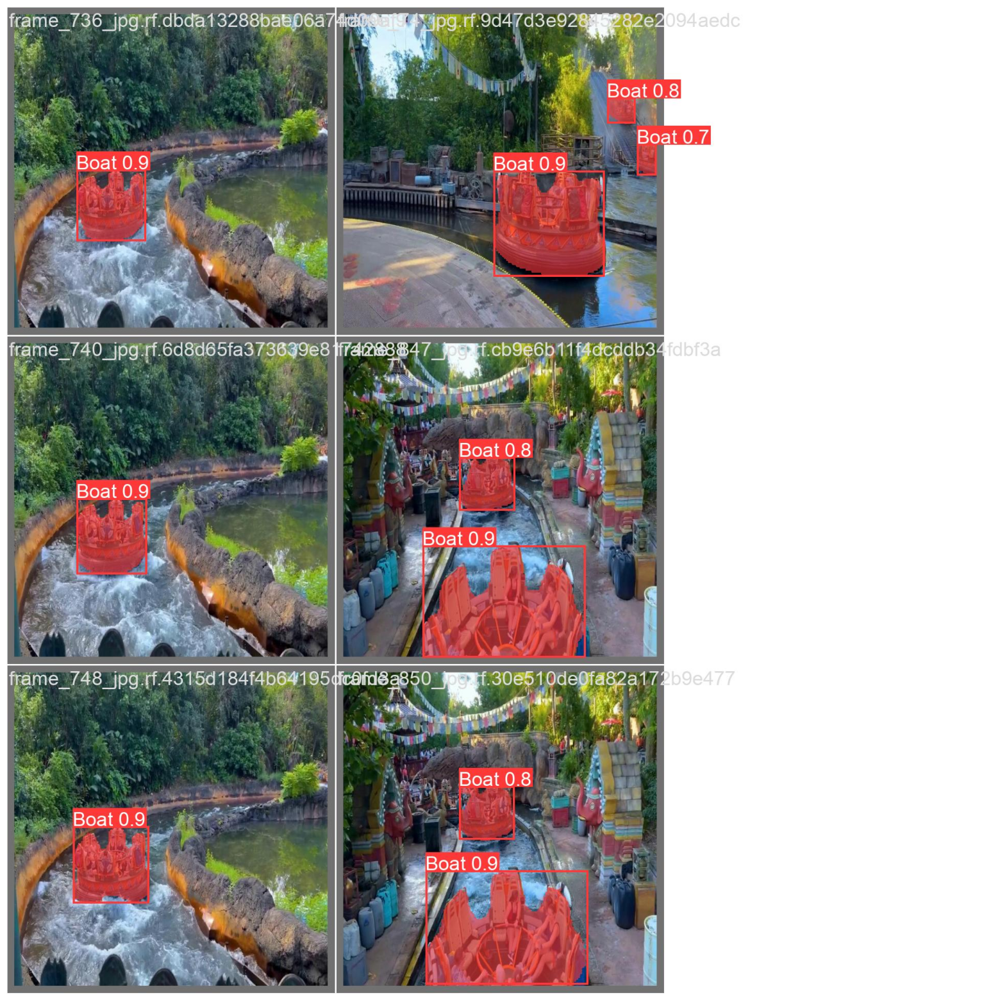

In [12]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/val_batch1_pred.jpg'
visualize_image(image_path)

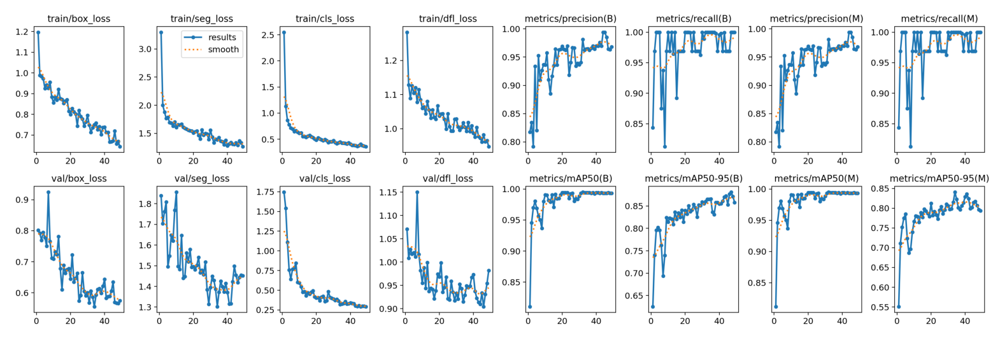

In [13]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/results.png'
visualize_image(image_path)

The Losses are looking pretty god

## Prediction on Video for testing how it performs

In [14]:
!yolo segment track model=/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_S/weights/best.pt source='/kaggle/input/kali-test-2/kali_test_2.mp4'

requirements: Ultralytics requirement ['lapx>=0.5.2'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 8.9 MB/s eta 0:00:00a 0:00:01

requirements: AutoUpdate success ✅ 12.2s, installed 1 package: ['lapx>=0.5.2']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8s-seg summary (fused): 195 layers, 11779987 parameters, 0 gradients, 42.4 GFLOPs

video 1/1 (frame 1/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 111.0ms
video 1/1 (frame 2/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 16.6ms
video 1/1 (frame 3/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 16.6ms
video 1/1 (frame 4/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 16.6ms
video 1/1 (frame 5/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 16.5ms
video 1/1 (frame 6/1018) /kaggle/inpu

# Let's see how it performed

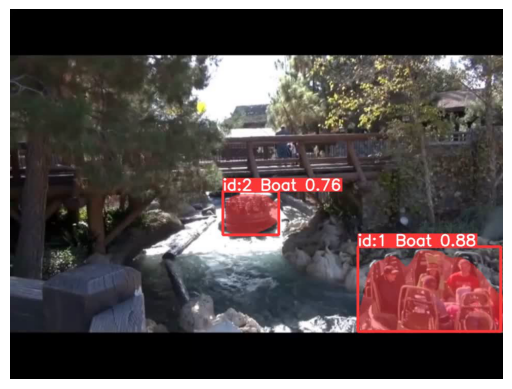

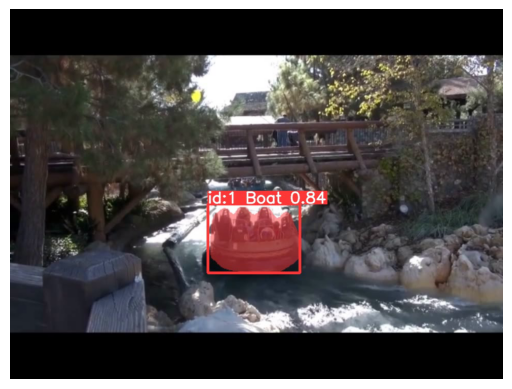

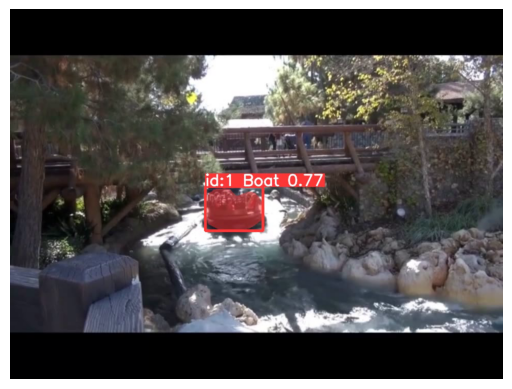

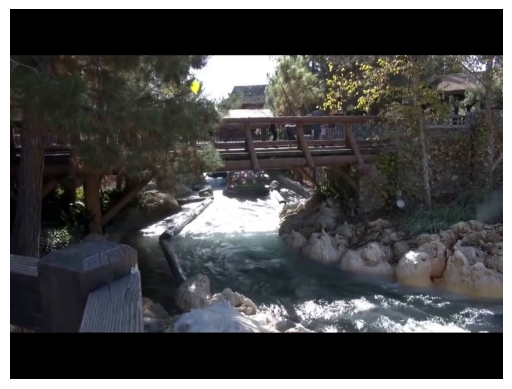

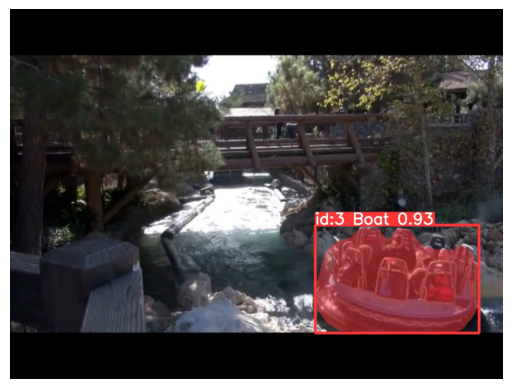

...

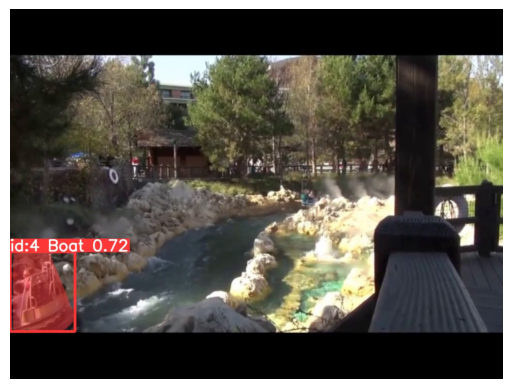

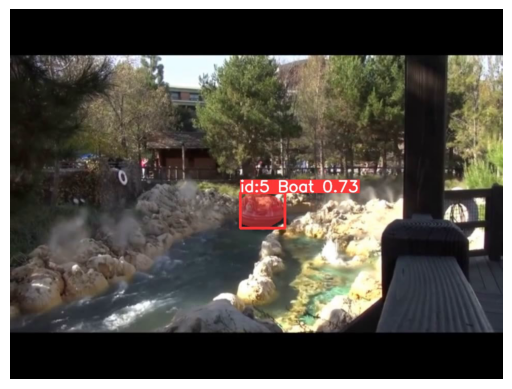

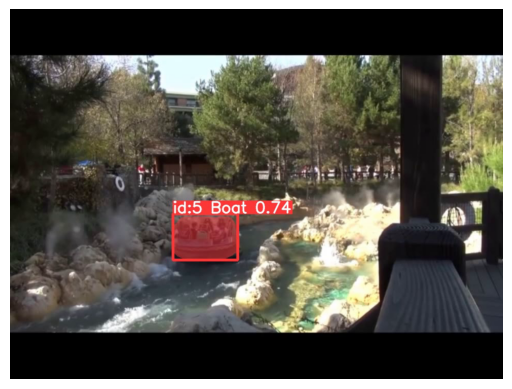

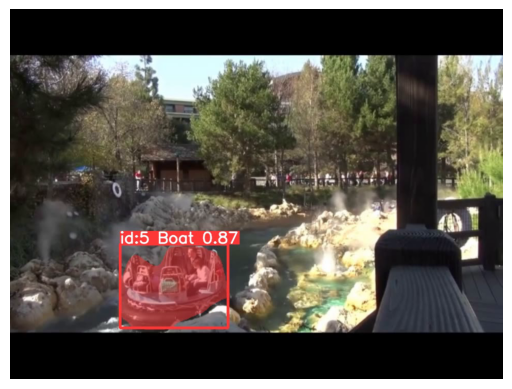

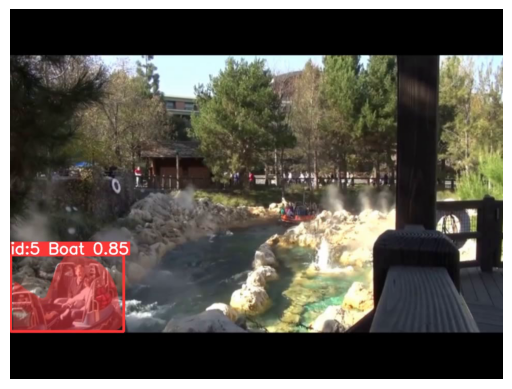

Failed to capture frame


In [15]:
import cv2
cap=cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track/kali_test_2.avi')
count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        print("Failed to capture frame")
        break
    if(count%100==0):  # show only 50th frame
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.axis('off')
        plt.show()  
    count += 1

cap.release()

In [ ]:
import cv2
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
color = (0, 0, 0)
thickness = 2

In [ ]:
# Load the two videos
video1 = cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track7/kali_test_2.avi')
video2 = cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track6/kali_test_2.avi')

# Get the frame width and height of the first video
frame_width1 = int(video1.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height1 = int(video1.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create a new video writer object to write the combined video
video_writer = cv2.VideoWriter('combined_video_yolo6.avi',cv2.VideoWriter_fourcc(*'XVID'), 30, (frame_width1*2, frame_height1))
while True:
    # Read the next frame from each video
    ret1, frame1 = video1.read()
    ret2, frame2 = video2.read()

    # If we reached the end of either video, break out of the loop
    if not ret1 or not ret2:
        break

    # Resize the frames to the same size
    frame1 = cv2.resize(frame1, (frame_width1, frame_height1))
    frame2 = cv2.resize(frame2, (frame_width1, frame_height1))
    
    # Add text to each frame
    cv2.putText(frame1, "Yolov8s Avgrage Inference 15ms", (50, 150), font, font_scale, color, thickness, cv2.LINE_AA)
    cv2.putText(frame2, "Yolov8m Avgrage Inference 20ms", (50,150), font, font_scale, color, thickness, cv2.LINE_AA)
     # Combine the two frames side by side
    combined_frame = cv2.hconcat([frame1, frame2])

    # Write the combined frame to the new video
    video_writer.write(combined_frame)

# Release the video capture and writer objects
video1.release()
video2.release()
video_writer.release()